In [ ]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
import base64
from IPython.display import HTML
from datetime import datetime

from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE
import pandas as pd


In [ ]:
# Carregar os dados
data_path = '/content/sample_data/dados_originais (6).csv'  # Substitua pelo caminho correto do arquivo
dat = pd.read_csv(data_path)
dat['timestamp_dt'] = pd.to_datetime(dat['timestamp_dt'])

# Interpolar valores faltantes na coluna 'value'
dat['value'].interpolate(method='linear', inplace=True)

# Visualização dos resultados pelo Plotly
fig = go.Figure()
fig.add_trace(go.Scatter(x=dat['timestamp_dt'], y=dat['value'], mode='lines', name='Dados Originais', marker=dict(color='blue')))
fig.update_layout(title='Dados Originais e Outliers', xaxis_title='Data e Hora', yaxis_title='Valor', xaxis=dict(type='date'))
fig.show()

In [ ]:
cluster_intervals = [

    ("2024-04-25 01:39", "2024-04-25 02:56", 1),
    ("2024-04-25 03:55", "2024-04-25 05:05", 2),
    ("2024-04-25 06:37", "2024-04-25 07:40", 3),
    ("2024-04-25 09:30", "2024-04-25 10:58", 4),
    ("2024-04-25 12:00", "2024-04-25 13:12", 5),
    ("2024-04-25 14:34", "2024-04-25 15:45", 6),
    ("2024-04-25 16:21", "2024-04-25 18:10", 7),
    ("2024-04-25 19:23", "2024-04-25 20:42", 8),
    ("2024-04-25 21:29", "2024-04-25 22:40", 9),
    ("2024-04-26 00:06", "2024-04-26 01:13", 10),
    ("2024-04-26 02:12", "2024-04-26 04:12", 11),
    ("2024-04-26 05:39", "2024-04-26 07:06", 12),
    ("2024-04-26 08:05", "2024-04-26 09:10", 13),
    ("2024-04-26 11:42", "2024-04-26 13:06", 14),
    ("2024-04-26 14:32", "2024-04-26 18:02", 15),
    ("2024-04-26 19:19", "2024-04-26 21:03", 16),
    ("2024-04-26 22:14", "2024-04-25 23:21", 17),
    ("2024-04-27 01:52", "2024-04-27 03:10", 18),
    ("2024-04-29 05:35", "2024-04-29 07:43", 19),
    ("2024-04-29 10:07", "2024-04-29 21:09", 20)

]

clusters_data = {}

for start, end, label in cluster_intervals:
    start_dt = datetime.strptime(start, "%Y-%m-%d %H:%M")
    end_dt = datetime.strptime(end, "%Y-%m-%d %H:%M")
    # Filtrar os dados para o intervalo de cada cluster
    cluster_segment = dat[(dat['timestamp_dt'] >= start_dt) & (dat['timestamp_dt'] <= end_dt)]
    # Armazenar o segmento no dicionário com a chave sendo o label do cluster
    clusters_data[label] = cluster_segment

In [ ]:
# Inicializar todos os registros como fora de qualquer cluster (cluster 0)
dat['cluster_label'] = 0

# Atualizar os rótulos de cluster com os intervalos especificados
for start, end, label in cluster_intervals:
    start_dt = datetime.strptime(start, "%Y-%m-%d %H:%M")
    end_dt = datetime.strptime(end, "%Y-%m-%d %H:%M")
    dat.loc[(dat['timestamp_dt'] >= start_dt) & (dat['timestamp_dt'] <= end_dt), 'cluster_label'] = label

In [ ]:
print(cluster_data)

cluster_label  0   1   2   3   4   5   6   7   8   9   10  11  12  13  14  15  \
0             NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN   
1             NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN   
2             NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN   
3             NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN   
4             NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN   
...            ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..   
4442          NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN   
4443          NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN   
4444          NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN   
4445          NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN   
4446          NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN NaN   

cluster_label  16  18  19  

In [ ]:
import matplotlib.pyplot as plt
# Gerar uma paleta de cores suficiente para todos os clusters mais um para o cluster 0
colors = plt.cm.get_cmap('tab20', len(cluster_intervals) + 1)  # Adicionando +1 para o cluster 0

# Criar um gráfico usando Plotly
fig = go.Figure()

# Plotar o cluster 0 separadamente
cluster_0_data = dat[dat['cluster_label'] == 0]
color_0 = f'rgb({colors(0)[0]*255}, {colors(0)[1]*255}, {colors(0)[2]*255})'
fig.add_trace(go.Scatter(x=cluster_0_data['timestamp_dt'], y=cluster_0_data['value'], mode='markers', name='Cluster 0 (Outros)', marker=dict(color=color_0)))

# Plotar cada cluster com uma cor diferente
for (start, end, label), i in zip(cluster_intervals, range(1, len(cluster_intervals)+1)):  # Começa de 1 porque o cluster 0 já foi plotado
    color = f'rgb({colors(i)[0]*255}, {colors(i)[1]*255}, {colors(i)[2]*255})'
    cluster_segment = dat[dat['cluster_label'] == label]
    fig.add_trace(go.Scatter(x=cluster_segment['timestamp_dt'], y=cluster_segment['value'], mode='markers', name=f'Cluster {label}', marker=dict(color=color)))

# Atualizar o layout do gráfico
fig.update_layout(
    title='Visualização dos Dados por Cluster',
    xaxis_title='Data e Hora',
    yaxis_title='Valor',
    xaxis=dict(type='date'),
    legend_title="Clusters"
)

# Exibir o gráfico
fig.show()

<ipython-input-64-442b8704fad3>:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



In [ ]:
# Filtrar os dados para excluir o cluster 0
dat_clusters = dat[dat['cluster_label'] != 0]

# Separar a coluna 'value' para treinamento
values = dat_clusters[['value']]

# Escalar os valores de 'value'
scaler = MinMaxScaler(feature_range=(0, 1))
values_scaled = scaler.fit_transform(values)

In [ ]:
# Função para criar sequências de tempo
def create_sequences(data, seq_length):
    xs = []
    ys = []
    for i in range(len(data) - seq_length):
        x = data[i:i+seq_length]
        y = data[i+seq_length]
        xs.append(x)
        ys.append(y)
    return np.array(xs), np.array(ys)


In [ ]:
# Definir o comprimento da sequência
seq_length = 2  # ajuste conforme necessário

# Criar sequências
X_sequences, y_sequences = create_sequences(values_scaled, seq_length)

# Dividir os dados em conjuntos de treinamento e teste (80% treinamento, 20% teste)
train_size = int(len(X_sequences) * 0.7)
X_train, X_test = X_sequences[:train_size], X_sequences[train_size:]
y_train, y_test = y_sequences[:train_size], y_sequences[train_size:]

# Reformatar os dados para a entrada do LSTM (samples, time steps, features)
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1)).astype(np.float32)
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1)).astype(np.float32)
y_train = y_train.astype(np.float32)
y_test = y_test.astype(np.float32)

In [ ]:
# Criar o modelo LSTM
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(seq_length, 1)))
model.add(LSTM(50))
model.add(Dense(1))


In [ ]:
# Compilar o modelo
model.compile(optimizer='adam', loss='mean_squared_error')



Epoch 1/100
83/83 [==============================] - 5s 5ms/step - loss: 0.1949
Epoch 2/100
83/83 [==============================] - 0s 5ms/step - loss: 0.0105
Epoch 3/100
83/83 [==============================] - 0s 5ms/step - loss: 0.0106
Epoch 4/100
83/83 [==============================] - 0s 5ms/step - loss: 0.0106
Epoch 5/100
83/83 [==============================] - 0s 5ms/step - loss: 0.0106
Epoch 6/100
83/83 [==============================] - 0s 5ms/step - loss: 0.0105
Epoch 7/100
83/83 [==============================] - 1s 7ms/step - loss: 0.0105
Epoch 8/100
83/83 [==============================] - 1s 7ms/step - loss: 0.0106
Epoch 9/100
83/83 [==============================] - 1s 8ms/step - loss: 0.0105
Epoch 10/100
83/83 [==============================] - 1s 9ms/step - loss: 0.0106
Epoch 11/100
83/83 [==============================] - 1s 9ms/step - loss: 0.0107
Epoch 12/100
83/83 [==============================] - 1s 8ms/step - loss: 0.0105
Epoch 13/100
83/83 [=================

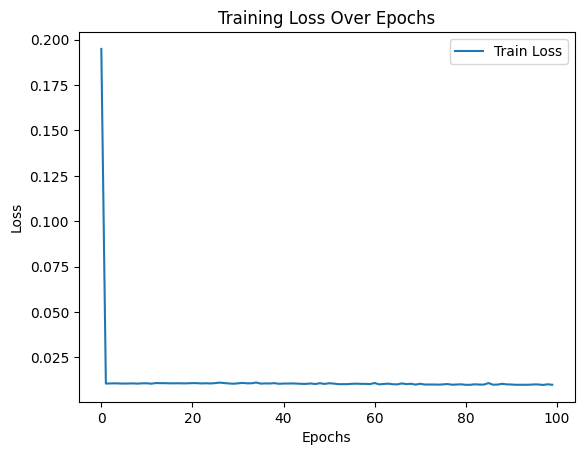

In [ ]:
# Treinar o modelo e armazenar o histórico
history = model.fit(X_sequences, y_sequences, epochs=100, batch_size=16)

# Plotar a perda (loss)
plt.plot(history.history['loss'], label='Train Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss Over Epochs')
plt.legend()
plt.show()

In [ ]:
# Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)


13/13 [==============================] - 1s 4ms/step


In [ ]:
# Inverter a normalização para obter os valores reais
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
y_pred_inverse = scaler.inverse_transform(y_pred)

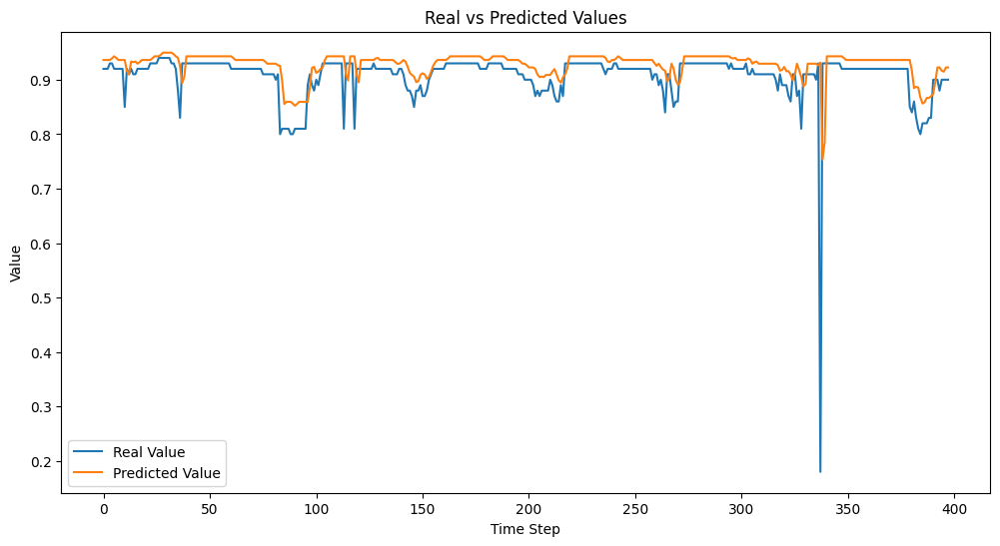

In [ ]:
# Plotar os resultados
plt.figure(figsize=(12, 6))
plt.plot(y_test_inverse, label='Real Value')
plt.plot(y_pred_inverse, label='Predicted Value')
plt.xlabel('Time Step')
plt.ylabel('Value')
plt.title('Real vs Predicted Values')
plt.legend()
plt.show()

In [ ]:
import plotly.graph_objects as go
# Identificar os índices dos dados de teste no DataFrame original
test_indices = dat_clusters.index[seq_length + train_size:]

# Adicionar uma nova coluna ao DataFrame original para armazenar os valores previstos
dat['predicted_value'] = np.nan

# Atribuir os valores previstos à nova coluna nos índices correspondentes
dat.loc[test_indices, 'predicted_value'] = y_pred_inverse.flatten()

# Criar o gráfico interativo usando Plotly
fig = go.Figure()

# Adicionar traço dos valores reais
fig.add_trace(go.Scatter(x=dat['timestamp_dt'], y=dat['value'], mode='lines', name='Real Value', line=dict(color='blue')))

# Adicionar traço dos valores previstos
fig.add_trace(go.Scatter(x=dat['timestamp_dt'], y=dat['predicted_value'], mode='lines', name='Predicted Value', line=dict(color='red')))

# Atualizar layout do gráfico
fig.update_layout(
    title='Real vs Predicted Values',
    xaxis_title='Timestamp',
    yaxis_title='Value',
    xaxis=dict(type='date'),
    legend_title="Legend"
)

# Mostrar o gráfico interativo
fig.show()

### **MODELO DO TENSORFLOW KERAS LSTM**

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, Attention, Concatenate



### **Hora do "testamento"**

In [14]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler


def prepare_data(data, n_steps, n_features):
    X, y = [], []
    scaler = MinMaxScaler()

    # Considerando que as últimas n_features colunas são as features e a primeira coluna 'value' é o target
    data_scaled = scaler.fit_transform(data)

    for i in range(len(data) - n_steps):
        # X: janela de 'n_steps' contendo 'n_features' features
        # y: valor de 'value' no timestep seguinte
        X.append(data_scaled[i:i + n_steps, -n_features:])
        y.append(data_scaled[i + n_steps, 0])

    X, y = np.array(X), np.array(y)
    return X, y, scaler

# Carregando seus dados
data = pd.read_csv('/content/sample_data/device_172383__variable_potencia_ativa_total__aggregation_raw.csv')
#Supondo que você tenha 4 features na ordem correta e 'value' como a primeira coluna
data_array = data[['value']].to_numpy()

n_steps = 5
n_features = 1
X, y, scaler = prepare_data(data_array, n_steps, n_features)

In [15]:
def split_data(X, y, train_ratio=0.5, validation_ratio=0.3):
    total_samples = len(X)
    train_size = int(total_samples * train_ratio)
    validation_size = int(total_samples * validation_ratio)

    # Dados de treinamento
    X_train, y_train = X[:train_size], y[:train_size]
    # Dados de validação
    X_val, y_val = X[train_size:train_size + validation_size], y[train_size:train_size + validation_size]
    # Dados de teste
    X_test, y_test = X[train_size + validation_size:], y[train_size + validation_size:]

    return X_train, y_train, X_val, y_val, X_test, y_test

# Dividindo os dados
X_train, y_train, X_val, y_val, X_test, y_test = split_data(X, y)


In [16]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, Dropout, Attention, Concatenate

# Construção do modelo LSTM autoencoder
input_layer = Input(shape=(n_steps, n_features))
lstm_out = LSTM(50, return_sequences=True)(input_layer)
attention = Attention()([lstm_out, lstm_out])  # usando lstm_out duas vezes para auto atenção
attention_output = Concatenate()([lstm_out, attention])
flat_output = tf.keras.layers.Flatten()(attention_output)
dense_layer = Dense(50, activation='relu')(flat_output)
output_layer = Dense(1)(dense_layer)

model = Model(inputs=input_layer, outputs=output_layer)
model.compile(optimizer='adam', loss='mse')
model.summary()

# Treinamento do modelo
history = model.fit(X_train, y_train, epochs=2, batch_size=4, validation_data=(X_val, y_val), verbose=1)

# Avaliação do modelo no conjunto de teste
test_loss = model.evaluate(X_test, y_test)


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 5, 1)]               0         []                            
                                                                                                  
 lstm_1 (LSTM)               (None, 5, 50)                10400     ['input_2[0][0]']             
                                                                                                  
 attention_1 (Attention)     (None, 5, 50)                0         ['lstm_1[0][0]',              
                                                                     'lstm_1[0][0]']              
                                                                                                  
 concatenate_1 (Concatenate  (None, 5, 100)               0         ['lstm_1[0][0]',        

 Verificação e Sugestões de Modelo
Arquitetura do Modelo: Você utilizou uma combinação interessante de LSTM e atenção. Isso é particularmente útil para dar ênfase às partes mais importantes da sequência de entrada.

Camadas e Neurônios: Você escolheu 50 unidades LSTM. Certifique-se de que este número é adequado para a complexidade do seu problema. Às vezes, um número maior de unidades pode capturar melhor a complexidade dos dados, mas também pode levar a sobreajuste.

Camada de Saída: A camada de saída usa uma única unidade sem função de ativação especificada, o que é comum para problemas de regressão. Se o seu objetivo for classificação (por exemplo, anomalia vs. normal), você precisará modificar isso para usar uma função de ativação sigmoid ou softmax (dependendo se é binária ou multiclasse) e ajustar o número de neurônios de acordo com o número de classes.

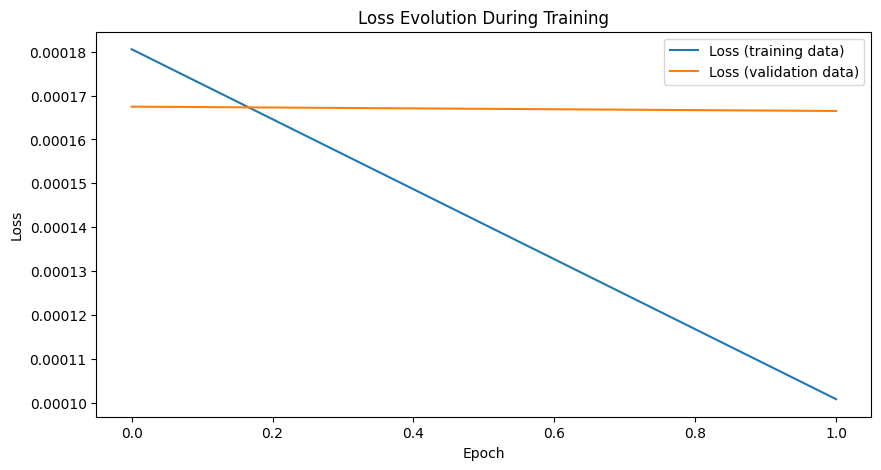

In [17]:
import matplotlib.pyplot as plt

def plot_training_history(history):
    """Plota a perda e a perda de validação ao longo das épocas."""
    plt.figure(figsize=(10, 5))
    plt.plot(history.history['loss'], label='Loss (training data)')
    plt.plot(history.history['val_loss'], label='Loss (validation data)')
    plt.title('Loss Evolution During Training')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc="upper right")
    plt.show()

plot_training_history(history)


In [29]:
# Fazendo previsões no conjunto de teste
y_pred = model.predict(X_test)

998/998 [==============================] - 4s 3ms/step


In [19]:
print(X_test)

[[[0.00159253]
  [0.00159253]
  [0.00159253]
  [0.00159253]
  [0.00159253]]

 [[0.00159253]
  [0.00159253]
  [0.00159253]
  [0.00159253]
  [0.00159253]]

 [[0.00159253]
  [0.00159253]
  [0.00159253]
  [0.00159253]
  [0.00159253]]

 ...

 [[0.3686436 ]
  [0.3697419 ]
  [0.36919275]
  [0.36919275]
  [0.36908292]]

 [[0.3697419 ]
  [0.36919275]
  [0.36919275]
  [0.36908292]
  [0.36908292]]

 [[0.36919275]
  [0.36919275]
  [0.36908292]
  [0.36908292]
  [0.36946733]]]


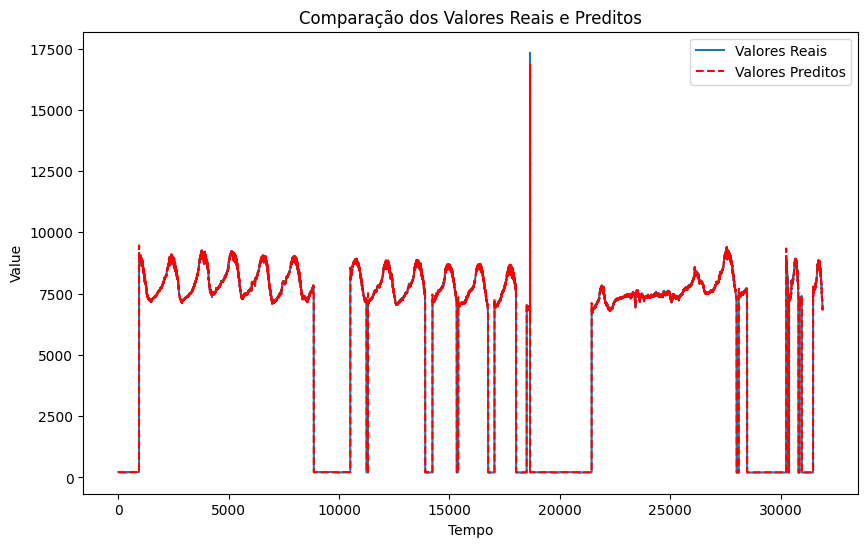

In [20]:
import matplotlib.pyplot as plt



# Invertendo a normalização para plotar os dados reais e os preditos
y_test_real = scaler.inverse_transform(y_test.reshape(-1, 1))
y_pred_real = scaler.inverse_transform(y_pred)

# Plotando os resultados
plt.figure(figsize=(10, 6))
plt.plot(y_test_real, label='Valores Reais')
plt.plot(y_pred_real, label='Valores Preditos', linestyle='--', color= 'red')
plt.title('Comparação dos Valores Reais e Preditos')
plt.xlabel('Tempo')
plt.ylabel('Value')
plt.legend()
plt.show()


In [28]:
import plotly.graph_objects as go

# Invertendo a normalização para plotar os dados reais e os preditos
y_test_real = scaler.inverse_transform(y_test.reshape(-1, 1))
y_pred_real = scaler.inverse_transform(y_pred)

# Convertendo range para lista
x_values = list(range(len(y_test_real)))

# Criando a figura
fig = go.Figure()

# Adicionando os dados reais
fig.add_trace(go.Scatter(x=x_values, y=y_test_real.flatten(), mode='lines', name='Valores Reais'))

# Adicionando os valores preditos
fig.add_trace(go.Scatter(x=x_values, y=y_pred_real.flatten(), mode='lines', name='Valores Preditos', line=dict(dash='dash', color='red')))

# Personalizando o layout do gráfico
fig.update_layout(
    title='Comparação dos Valores Reais e Preditos',
    xaxis_title='Tempo',
    yaxis_title='Value',
    legend=dict(x=0, y=1, traceorder='normal', font=dict(family='Arial', size=12, color='black')),
    autosize=False,
    width=1000,
    height=600,
)

# Exibindo o gráfico
fig.show()


In [ ]:
model.save('compressor_lstm_model.h5')  # Salva o modelo em formato HDF5
from google.colab import files

files.download('compressor_lstm_model.h5')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [110]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import load_model
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

# Carregando seus dados
data = pd.read_csv('/content/sample_data/device_172383__variable_potencia_ativa_total__aggregation_raw.csv')

# Supondo que você tenha 'value' como a coluna de interesse
data_test_array = data[['value']].to_numpy()

# Normalização dos dados
scaler = MinMaxScaler()
data_test_array_scaled = scaler.fit_transform(data_test_array)


In [100]:
# Carregando dados que serviram para treinamento
dat = pd.read_csv('/content/sample_data/device_1723834__variable_potencia_ativa_total__aggregation_raw.csv')
#Supondo que você tenha 4 features na ordem correta e 'value' como a primeira coluna
data_array = dat[['value']].to_numpy()

In [102]:
# Criando a figura
fig = go.Figure()

# Adicionando os dados reais
fig.add_trace(go.Scatter(x=dat['date'], y=dat['value'], mode='lines', name='Sem anomalia'))

# Adicionando os valores preditos
fig.add_trace(go.Scatter(x=data['date'], y=data['value'], mode='lines', name='Com anomalia', line=dict(dash='dash', color='red')))

# Personalizando o layout do gráfico
fig.update_layout(
    title='Comparação dos Valores Reais e Preditos',
    xaxis_title='Tempo',
    yaxis_title='Value',
    legend=dict(x=0, y=1, traceorder='normal', font=dict(family='Arial', size=12, color='black')),
    autosize=False,
    width=1000,
    height=600,
)

# Exibindo o gráfico
fig.show()

In [111]:
# Função para criar sequências de dados
def create_sequences(data, n_steps):
    sequences = []
    for i in range(len(data) - n_steps + 1):
        seq = data[i:i + n_steps]
        sequences.append(seq)
    return np.array(sequences)

n_steps = 5  # número de passos de tempo que o seu modelo espera
n_features = 1  # número de características que o seu modelo espera

# Criando sequências de dados
sequences_test = create_sequences(data_test_array_scaled, n_steps)

# Separando características e valores reais (labels)
X_test_data = sequences_test[:, :-1]
y_test_data = sequences_test[:, -1]

# Reshape para entrada do modelo
X_test_data = X_test_data.reshape(-1, n_steps - 1, n_features)

# Verificando os shapes das entradas e saídas
print("Formato de X_test_data:", X_test_data.shape)
print("Formato de y_test_data:", y_test_data.shape)

Formato de X_test_data: (130732, 4, 1)
Formato de y_test_data: (130732, 1)


In [112]:
# Carregar o modelo treinado (caso não esteja já carregado)
model = load_model('/content/compressor_lstm_model.h5')




In [113]:
# Desnormalizar os dados para obter os valores reais
predictions_rescaled = scaler.inverse_transform(predictions)
y_test_data_rescaled = scaler.inverse_transform(y_test_data)

In [130]:
# Calcular erros
errors = np.abs(predictions_rescaled - y_test_data_rescaled)
errors

array([[131.20068359],
       [133.94238281],
       [135.48193359],
       ...,
       [ 10.92953491],
       [ 10.92953491],
       [ 10.92950439]])

In [127]:
# Definir um limiar para identificar anomalias (aqui usando o percentil 95 como exemplo)
threshold = np.percentile(errors, 99)
anomalies = errors > threshold


In [128]:
# Extrair as posições das anomalias
anomalous_positions = np.where(anomalies)[0]

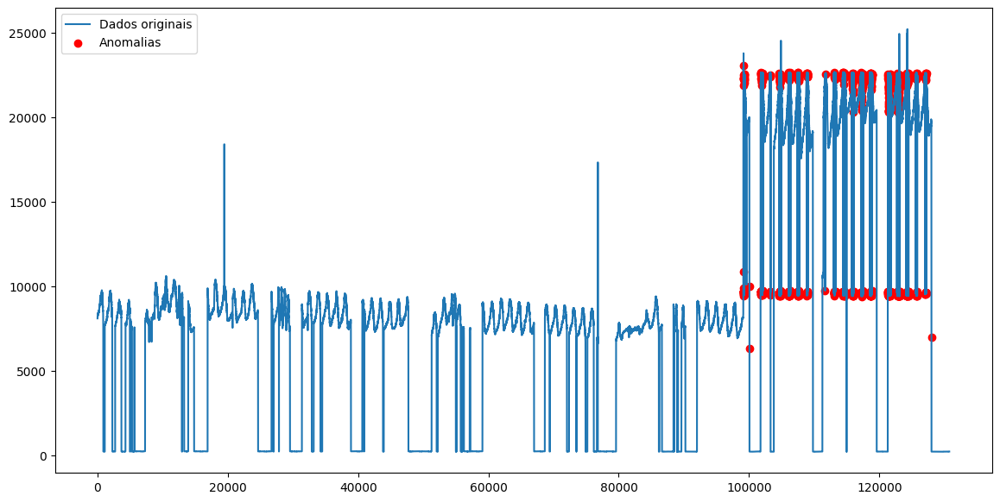

In [129]:
# Visualizar anomalias
plt.figure(figsize=(14, 7))
plt.plot(data_test_array, label='Dados originais')
plt.scatter(anomalous_positions + n_steps - 1, data_test_array[anomalous_positions + n_steps - 1], color='red', label='Anomalias')
plt.legend()
plt.show()

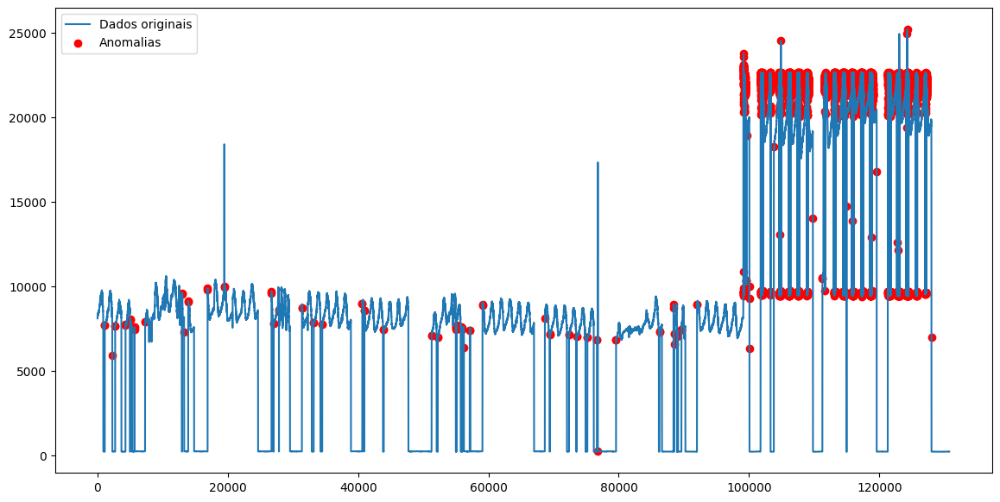

In [133]:
# Definir um limiar com base em desvio padrão
mean_error = np.mean(errors)
std_error = np.std(errors)
threshold = mean_error + 1 * std_error  # usando 3 desvios padrão acima da média
anomalies = errors > threshold

# Extrair as posições das anomalias
anomalous_positions = np.where(anomalies)[0]

# Visualizar anomalias
plt.figure(figsize=(14, 7))
plt.plot(data_test_array, label='Dados originais')
plt.scatter(anomalous_positions + n_steps - 1, data_test_array[anomalous_positions + n_steps - 1], color='red', label='Anomalias')
plt.legend()
plt.show()